### Notebook for of identified fetal stem cells populations with LGR5+ stem cells from Haber, 2017 dataset

- **Developed by:** Anna Maguza
- **Place:** Wuerzburg Institute for System Immunology
- **Created date:** 19th August 2024
- **Last modified date:** 9th September 2024

#### Import required modules

In [3]:
import gdown
import torch
import anndata
import warnings
import numpy as np
import scanpy as sc
import pandas as pd
import scarches as sca
import matplotlib.pyplot as plt

#### Set up working environment

In [6]:
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

In [7]:
warnings.simplefilter(action = 'ignore')
%config InlineBackend.print_figure_kwargs = {'facecolor' : "w"}
%config InlineBackend.figure_format = 'retina'
torch.set_float32_matmul_precision('medium')

In [8]:
torch.cuda.is_available()

True

#### Read in data

In [10]:
human_adata = sc.read_h5ad("data/Fetal_stem_cells_leiden.h5ad")

In [11]:
mouse_adata = sc.read_h5ad("data/Haber_2017_Smartseq_stem_cells_remapped.h5ad")

#### Create common set of genes

In [13]:
orthologues = pd.read_csv("data/saturn_results/macrogenes_derived_human_mouse_orthologues_10K.csv")

In [14]:
len(set(orthologues['Top Human Gene']).intersection(set(human_adata.var.index)))

6798

In [15]:
len(set(orthologues['Top Mouse Gene']).intersection(set(mouse_adata.var.index)))

6619

In [16]:
human_adata = human_adata[:, orthologues['Top Human Gene']]

In [17]:
human_adata.var.index.duplicated().sum()

3202

In [18]:
human_adata = human_adata[:, ~human_adata.var_names.duplicated()].copy()

+ remove dublicated genes from mouse dataset, leave genes that are expressed in more cells

In [19]:
mouse_adata.var.index.duplicated().sum()

175

In [20]:
mouse_adata = mouse_adata[:, ~mouse_adata.var_names.isin(['nan'])].copy()

In [21]:
mouse_adata = mouse_adata[:, ~mouse_adata.var_names.duplicated()].copy()

In [22]:
mouse_adata = mouse_adata[:, orthologues['Top Mouse Gene']]

In [23]:
mouse_adata.var['gene_name'] = mouse_adata.var.index

In [24]:
orthologues['Top Mouse Gene'].duplicated().sum()

3381

In [25]:
orthologues = orthologues[~orthologues['Top Mouse Gene'].duplicated()]

In [26]:
mouse_adata.var = mouse_adata.var.merge(orthologues, left_on = 'gene_name', right_on = 'Top Mouse Gene', how = 'left')

In [27]:
mouse_adata.var.index = mouse_adata.var['Top Human Gene']

In [28]:
mouse_adata.var.index.duplicated().sum()

5078

In [29]:
mouse_adata = mouse_adata[:, ~mouse_adata.var_names.duplicated()].copy()

In [30]:
common_genes = set(human_adata.var.index).intersection(set(mouse_adata.var.index))

human_adata = human_adata[:, human_adata.var.index.isin(common_genes)].copy()
mouse_adata = mouse_adata[:, mouse_adata.var.index.isin(common_genes)].copy()

+ Prepare obs

In [31]:
mouse_adata.obs['Library_Preparation_Protocol'] = 'Smart-seq2'
mouse_adata.obs['Sample_ID'] = mouse_adata.obs['Sample']
mouse_adata.obs['Study_name'] = 'Haber, 2017'


+ Extract LGR5+ cells

In [32]:
mouse_adata = mouse_adata[mouse_adata.obs['cell_type']=='LGR5+ stem cell']

### Read the Reactome annotations

In [33]:
reactome_link = 'database_data/reactome.gmt'

### Prepare reference data with ReactomeDB pathways

In [34]:
sca.utils.add_annotations(mouse_adata, reactome_link, min_genes = 12, clean = True)

- Remove all genes that are present in the data but absent in ReactomeDB

In [35]:
mouse_adata._inplace_subset_var(mouse_adata.varm['I'].sum(1)>0)

- Filter out all annotations (terms) with less than 12 genes.

In [36]:
select_terms = mouse_adata.varm['I'].sum(0)>12
mouse_adata.uns['terms'] = np.array(mouse_adata.uns['terms'])[select_terms].tolist()
mouse_adata.varm['I'] = mouse_adata.varm['I'][:, select_terms]

- Filter out genes not present in any of the terms after selection of HVGs.

In [37]:
mouse_adata._inplace_subset_var(mouse_adata.varm['I'].sum(1)>0)

### Create expiMap model and train it on reference dataset

In [38]:
mouse_adata.X = mouse_adata.X.astype(np.float32)

In [39]:
intr_cvae = sca.models.EXPIMAP(
    adata = mouse_adata,
    condition_key = 'cell_type',
    hidden_layer_sizes = [256, 256, 256],
    recon_loss = 'nb'
)


INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and cond: 1521 256 1
	Hidden Layer 1 in/out: 256 256
	Hidden Layer 2 in/out: 256 256
	Mean/Var Layer in/out: 256 202
Decoder Architecture:
	Masked linear layer in, ext_m, ext, cond, out:  202 0 0 1 1521
	with hard mask.
Last Decoder layer: softmax


In [40]:
ALPHA = 0.7

In [41]:
early_stopping_kwargs = {
    "early_stopping_metric": "val_unweighted_loss", # val_unweighted_loss
    "threshold": 0,
    "patience": 50,
    "reduce_lr": True,
    "lr_patience": 13,
    "lr_factor": 0.1,
}
intr_cvae.train(
    n_epochs = 400,
    alpha_epoch_anneal = 100,
    alpha = ALPHA,
    alpha_kl = 0.5,
    weight_decay = 0.,
    early_stopping_kwargs = early_stopping_kwargs,
    use_early_stopping = True,
    monitor_only_val = False,
    seed = 1712,
    accelerator = "gpu",
    devices = [0]
)

Preparing (367, 1521)
Instantiating dataset
Init the group lasso proximal operator for the main terms.
 |███████████████████-| 97.2%  - epoch_loss: 5208.6873372396 - epoch_recon_loss: 4971.8556315104 - epoch_kl_loss: 473.6631978353 - val_loss: 5667.5063476562 - val_recon_loss: 5446.2822265625 - val_kl_loss: 442.448669433662
ADJUSTED LR
 |████████████████████| 100.0%  - epoch_loss: 5127.2161458333 - epoch_recon_loss: 4896.1928710938 - epoch_kl_loss: 462.0467936198 - val_loss: 5676.0913085938 - val_recon_loss: 5446.1137695312 - val_kl_loss: 459.9554748535
Saving best state of network...
Best State was in Epoch 388


In [42]:
MEAN = False

In [43]:
mouse_adata.obsm['X_cvae'] = intr_cvae.get_latent(mean = MEAN, only_active = True)

+ Extract meaningful latent directions

In [44]:
intr_cvae.latent_directions(adata=mouse_adata)

### Initlizling the model for query training

### MTRNR2L12+ASS1+_SC

+ Prepare query dataset

In [45]:
human_adata_copy = human_adata.copy()

In [46]:
human_adata = human_adata[human_adata.obs['cell_type']=='MTRNR2L12+ASS1+_SC'].copy()

In [47]:
human_adata = human_adata[:, mouse_adata.var_names]

+ Add terms to query dataset

In [48]:
human_adata.uns['terms'] = mouse_adata.uns['terms']

+ Train the model

In [49]:
q_intr_cvae = sca.models.EXPIMAP.load_query_data(human_adata, intr_cvae,
                                                 unfreeze_ext=True,
                                                 use_hsic=True,
                                                 hsic_one_vs_all=True
                                                )

AnnData object with n_obs × n_vars = 3979 × 1521
    obs: 'Sample_ID', 'Cell Type', 'Study_name', 'Donor_ID', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'Library_Preparation_Protocol', 'batch', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'n_genes', 'n_counts', 'leiden', 'cluster', 'cell_type'
    var: 'feature_types-0-0-0', 'gene_name-1-0-0', 'gene_id-0-0', 'GENE-1-0', 'n_counts', 'n_cells'
    uns: 'Age_colors', 'Age_group_colors', 'Donor_ID_colors', 'Library_Preparation_Protocol_colors', 'Sex_colors', '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'rank_genes_groups', 'umap', 'terms'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    obsp: 'connectivities', 'distances'

INITI

In [50]:
q_intr_cvae.train(n_epochs = 400, 
                  alpha_epoch_anneal = 100, 
                  weight_decay = 0.,
                  alpha_kl = 0.1, 
                  seed = 1712, 
                  alpha_l1=0.96,
                  gamma_ext=0.7,
                  gamma_epoch_anneal=50, 
                  beta=3.,
                  use_early_stopping = True,
                  accelerator = "gpu",
                  devices = [0])

Preparing (3979, 1521)
Instantiating dataset
 |██████--------------| 32.8%  - val_loss: 744.5942687988 - val_recon_loss: 727.8506774902 - val_kl_loss: 167.43582916261
ADJUSTED LR
 |██████--------------| 34.5%  - val_loss: 750.9074401855 - val_recon_loss: 734.1310272217 - val_kl_loss: 167.7640953064
Stopping early: no improvement of more than 0 nats in 20 epochs
If the early stopping criterion is too strong, please instantiate it with different parameters in the train method.
Saving best state of network...
Best State was in Epoch 116


### Get latent representation of reference + query dataset

In [51]:
adata_joined = sc.AnnData.concatenate(mouse_adata, human_adata, batch_key = 'batch_join', uns_merge = 'same', index_unique = None)
adata_joined

AnnData object with n_obs × n_vars = 4346 × 1521
    obs: 'barcode', 'Gene_marker', 'Donor_ID', 'GFP_intensity', 'full_cell_description', 'cell_type', 'Sample', 'n_genes', 'n_counts', 'Library_Preparation_Protocol', 'Sample_ID', 'Study_name', 'Cell Type', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'batch', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'leiden', 'cluster', 'batch_join'
    var: 'ensemble_gene_id_version-0', 'ensemble_gene_id-0', 'start_position-0', 'end_position-0', 'chromosome_name-0', 'external_gene_name-0', 'n_counts-0', 'n_cells-0', 'gene_name-0', 'Macrogene-0', 'Top Human Gene-0', 'Top Mouse Gene-0', 'n_counts-1', 'n_cells-1', 'feature_types-0-0-0-1', 'gene_name-1-0-0-1', 'gene_id-0-0-1', 'GENE-1-0-1'
    uns: 'terms'

+ Get latent representation for the concatenated dataset

In [52]:
adata_joined.obsm['X_cvae'] = q_intr_cvae.get_latent(adata_joined.X, 
                                                adata_joined.obs['cell_type'], 
                                                mean = MEAN, 
                                                only_active = True)

+ Visualize latent representation on the UMAP

In [53]:
if 'neighbors' in adata_joined.uns:
    del adata_joined.uns['neighbors']
sc.pp.neighbors(adata_joined, n_neighbors=20, metric='minkowski', use_rep='X_cvae')
sc.tl.umap(adata_joined, min_dist = 0.5, spread = 6, random_state = 1712)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:27)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:04)


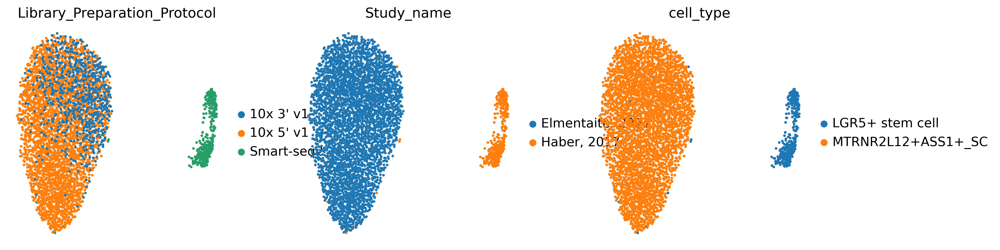

In [54]:
sc.pl.umap(adata_joined, color=['Library_Preparation_Protocol', 'Study_name', 'cell_type'], frameon=False)

+ Extract meaningful latent directions

In [55]:
q_intr_cvae.latent_directions(adata=adata_joined)

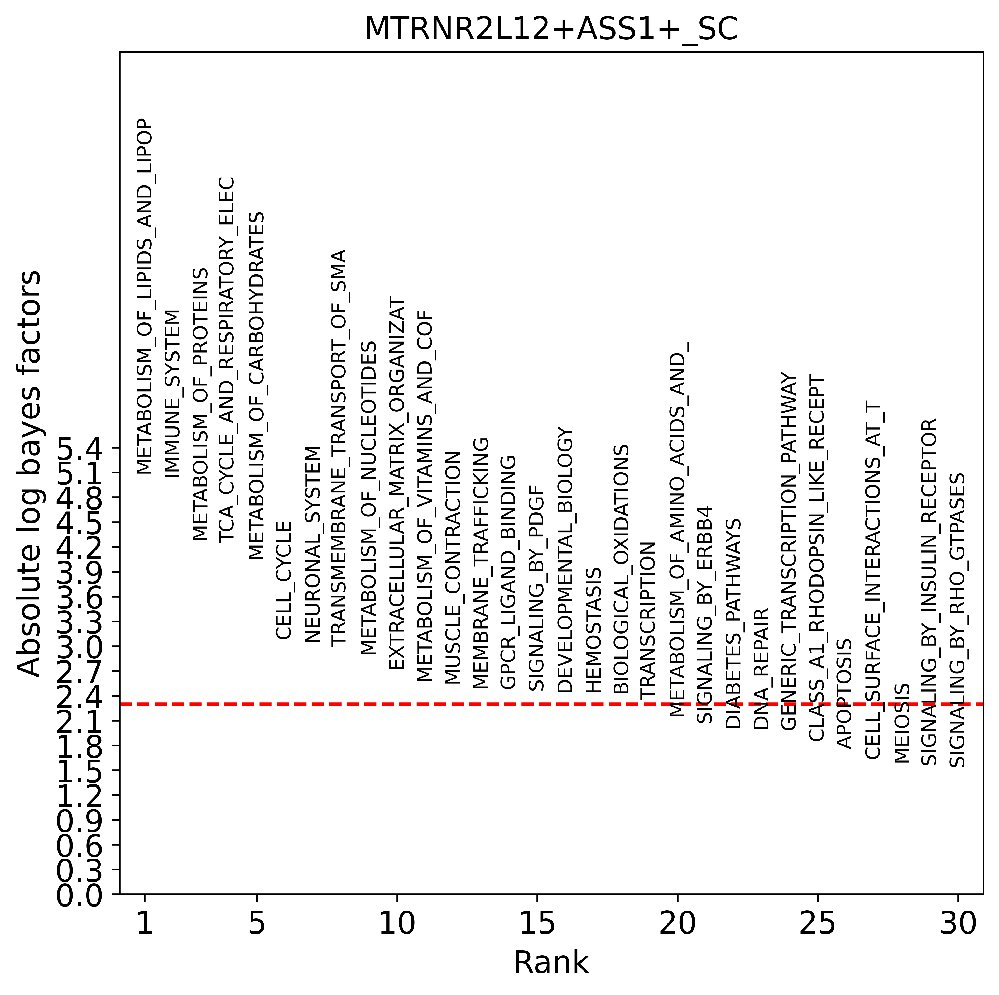

In [56]:
sc.set_figure_params(dpi=300, figsize=(7, 7))
q_intr_cvae.latent_enrich(groups = 'cell_type', comparison = 'LGR5+ stem cell', adata = adata_joined, use_directions = True)
fig = sca.plotting.plot_abs_bfs(adata_joined, yt_step = 0.3, scale_y = 2, fontsize = 9)

In [63]:
df=q_intr_cvae.term_genes('IMMUNE_SYSTEM', terms=adata_joined.uns['terms'])
df.to_csv('data/expimap_results/IMMUNE_SYSTEM_genes_MTRNR2L12+ASS1+_SC_vs_LGR5+.csv')

+ Extract gene programs and absolute log bayes factors in the dataframe 

In [57]:
scores = adata_joined.uns['bf_scores']
terms = adata_joined.uns['terms']

all_programs = []

for key in scores.keys():
    bfs = np.abs(scores[key]['bf'])
    for bf, term in zip(bfs, terms):
        all_programs.append({
            'Comparison': key,
            'Gene Program': term,
            'Absolute Log Bayes Factor': bf
        })

df_gene_programs = pd.DataFrame(all_programs)
df_gene_programs = df_gene_programs.sort_values('Absolute Log Bayes Factor', ascending=False)

In [58]:
print(df_gene_programs.head())

             Comparison                    Gene Program  \
136  MTRNR2L12+ASS1+_SC  METABOLISM_OF_LIPIDS_AND_LIPOP   
180  MTRNR2L12+ASS1+_SC                   IMMUNE_SYSTEM   
85   MTRNR2L12+ASS1+_SC          METABOLISM_OF_PROTEINS   
9    MTRNR2L12+ASS1+_SC  TCA_CYCLE_AND_RESPIRATORY_ELEC   
162  MTRNR2L12+ASS1+_SC     METABOLISM_OF_CARBOHYDRATES   

     Absolute Log Bayes Factor  
136                   5.090644  
180                   5.048343  
85                    4.288482  
9                     4.247953  
162                   4.061630  


In [67]:
df_gene_programs.to_csv('data/expimap_results/LGR5high_vs_MTRNR2L12+ASS1+_SC.csv', index=False)

#### RPS10+_RPS17+_SC

In [64]:
human_adata = human_adata_copy.copy()

In [65]:
human_adata = human_adata[human_adata.obs['cell_type']=='RPS10+_RPS17+_SC'].copy()

In [66]:
human_adata = human_adata[:, mouse_adata.var_names]

+ Add terms to query dataset

In [67]:
human_adata.uns['terms'] = mouse_adata.uns['terms']

+ Train the model

In [68]:
q_intr_cvae = sca.models.EXPIMAP.load_query_data(human_adata, intr_cvae,
                                                 unfreeze_ext=True,
                                                 use_hsic=True,
                                                 hsic_one_vs_all=True
                                                )

AnnData object with n_obs × n_vars = 3544 × 1521
    obs: 'Sample_ID', 'Cell Type', 'Study_name', 'Donor_ID', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'Library_Preparation_Protocol', 'batch', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'n_genes', 'n_counts', 'leiden', 'cluster', 'cell_type'
    var: 'feature_types-0-0-0', 'gene_name-1-0-0', 'gene_id-0-0', 'GENE-1-0', 'n_counts', 'n_cells'
    uns: 'Age_colors', 'Age_group_colors', 'Donor_ID_colors', 'Library_Preparation_Protocol_colors', 'Sex_colors', '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'rank_genes_groups', 'umap', 'terms'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    obsp: 'connectivities', 'distances'

INITI

In [69]:
q_intr_cvae.train(n_epochs = 400, 
                  alpha_epoch_anneal = 100, 
                  weight_decay = 0.,
                  alpha_kl = 0.1, 
                  seed = 1712, 
                  alpha_l1=0.96,
                  gamma_ext=0.7,
                  gamma_epoch_anneal=50, 
                  beta=3.,
                  use_early_stopping = True,
                  accelerator = "gpu",
                  devices = [0])

Preparing (3544, 1521)
Instantiating dataset
 |███████████---------| 57.2%  - val_loss: 792.8030802409 - val_recon_loss: 777.6741739909 - val_kl_loss: 151.28889465333
ADJUSTED LR
 |████████████--------| 61.8%  - val_loss: 793.7955118815 - val_recon_loss: 778.6739095052 - val_kl_loss: 151.2161051432
ADJUSTED LR
 |█████████████-------| 68.5%  - val_loss: 797.0499877930 - val_recon_loss: 781.9218343099 - val_kl_loss: 151.2812754313
ADJUSTED LR
 |██████████████------| 70.2%  - val_loss: 793.0069986979 - val_recon_loss: 777.8907063802 - val_kl_loss: 151.1628824870
Stopping early: no improvement of more than 0 nats in 20 epochs
If the early stopping criterion is too strong, please instantiate it with different parameters in the train method.
Saving best state of network...
Best State was in Epoch 259


### Get latent representation of reference + query dataset

In [70]:
adata_joined = sc.AnnData.concatenate(mouse_adata, human_adata, batch_key = 'batch_join', uns_merge = 'same', index_unique = None)
adata_joined

AnnData object with n_obs × n_vars = 3911 × 1521
    obs: 'barcode', 'Gene_marker', 'Donor_ID', 'GFP_intensity', 'full_cell_description', 'cell_type', 'Sample', 'n_genes', 'n_counts', 'Library_Preparation_Protocol', 'Sample_ID', 'Study_name', 'Cell Type', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'batch', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'leiden', 'cluster', 'batch_join'
    var: 'ensemble_gene_id_version-0', 'ensemble_gene_id-0', 'start_position-0', 'end_position-0', 'chromosome_name-0', 'external_gene_name-0', 'n_counts-0', 'n_cells-0', 'gene_name-0', 'Macrogene-0', 'Top Human Gene-0', 'Top Mouse Gene-0', 'n_counts-1', 'n_cells-1', 'feature_types-0-0-0-1', 'gene_name-1-0-0-1', 'gene_id-0-0-1', 'GENE-1-0-1'
    uns: 'terms'

+ Get latent representation for the concatenated dataset

In [71]:
adata_joined.obsm['X_cvae'] = q_intr_cvae.get_latent(adata_joined.X, 
                                                adata_joined.obs['cell_type'], 
                                                mean = MEAN, 
                                                only_active = True)

+ Visualize latent representation on the UMAP

In [72]:
if 'neighbors' in adata_joined.uns:
    del adata_joined.uns['neighbors']
sc.pp.neighbors(adata_joined, n_neighbors=20, metric='minkowski', use_rep='X_cvae')
sc.tl.umap(adata_joined, min_dist = 0.5, spread = 6, random_state = 1712)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:03)


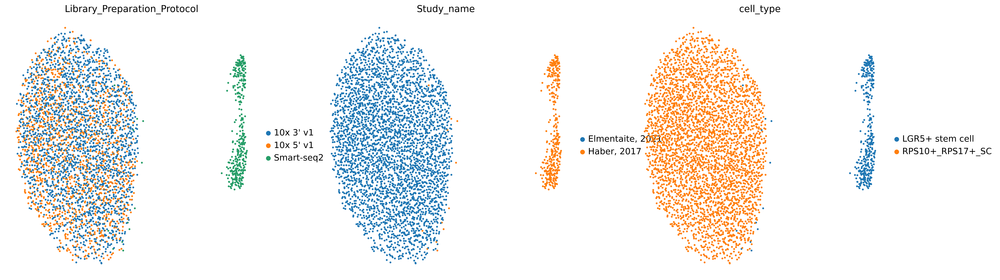

In [73]:
sc.pl.umap(adata_joined, color=['Library_Preparation_Protocol', 'Study_name', 'cell_type'], frameon=False)

+ Extract meaningful latent directions

In [74]:
q_intr_cvae.latent_directions(adata=adata_joined)

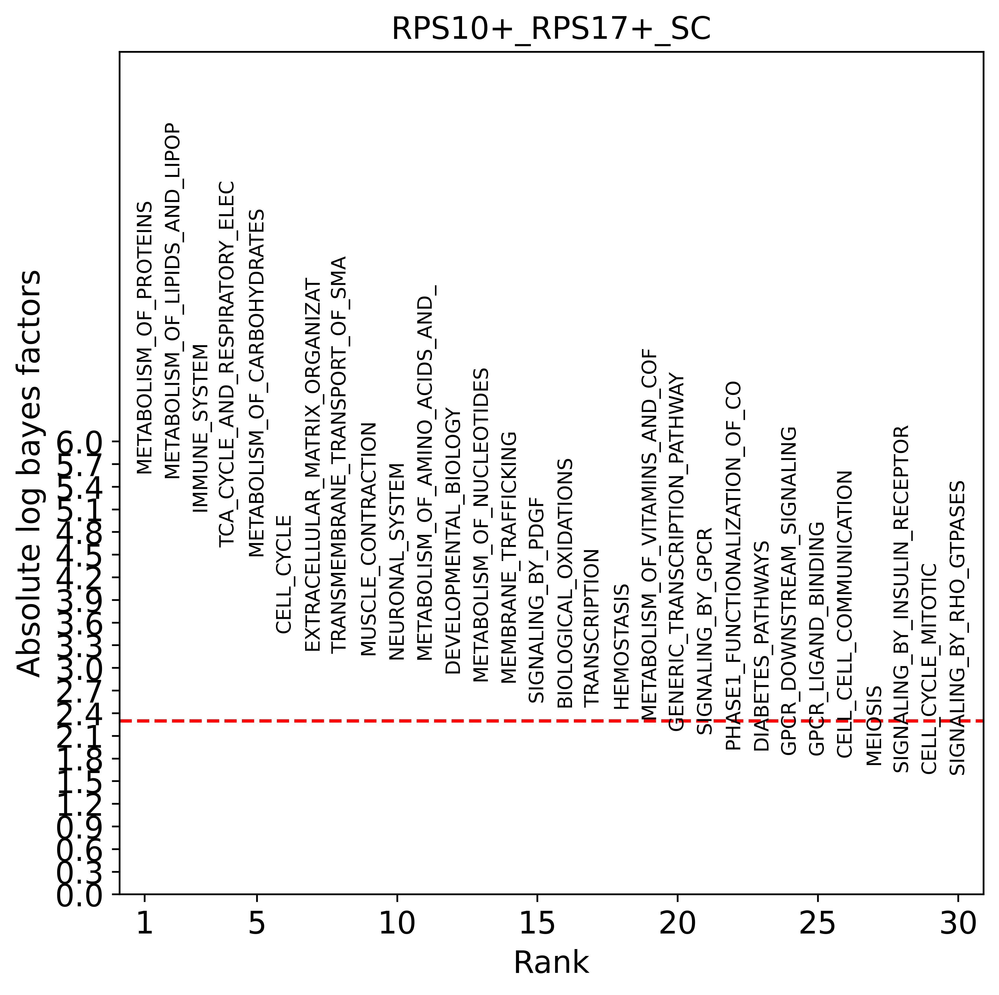

In [75]:
sc.set_figure_params(dpi=300, figsize=(7, 7))
q_intr_cvae.latent_enrich(groups = 'cell_type', comparison = 'LGR5+ stem cell', adata = adata_joined, use_directions = True)
fig = sca.plotting.plot_abs_bfs(adata_joined, yt_step = 0.3, scale_y = 2, fontsize = 9)

In [76]:
df=q_intr_cvae.term_genes('IMMUNE_SYSTEM', terms=adata_joined.uns['terms'])
df.to_csv('data/expimap_results/IMMUNE_SYSTEM_genes_RPS10_vs_LGR5+.csv')

+ Extract gene programs and absolute log bayes factors in the dataframe 

In [83]:
scores = adata_joined.uns['bf_scores']
terms = adata_joined.uns['terms']

all_programs = []

for key in scores.keys():
    bfs = np.abs(scores[key]['bf'])
    for bf, term in zip(bfs, terms):
        all_programs.append({
            'Comparison': key,
            'Gene Program': term,
            'Absolute Log Bayes Factor': bf
        })

df_gene_programs = pd.DataFrame(all_programs)
df_gene_programs = df_gene_programs.sort_values('Absolute Log Bayes Factor', ascending=False)

In [84]:
print(df_gene_programs.head())

           Comparison                    Gene Program  \
136  RPS10+_RPS17+_SC  METABOLISM_OF_LIPIDS_AND_LIPOP   
180  RPS10+_RPS17+_SC                   IMMUNE_SYSTEM   
19   RPS10+_RPS17+_SC                      CELL_CYCLE   
162  RPS10+_RPS17+_SC     METABOLISM_OF_CARBOHYDRATES   
9    RPS10+_RPS17+_SC  TCA_CYCLE_AND_RESPIRATORY_ELEC   

     Absolute Log Bayes Factor  
136                   5.776338  
180                   5.080191  
19                    4.724124  
162                   4.317134  
9                     4.146453  


In [85]:
df_gene_programs.to_csv('data/expimap_results/LGR5high_vs_RPS10+_RPS17+_SC.csv', index=False)

#### FXYD3+_CKB+_SC

In [77]:
human_adata = human_adata_copy.copy()

In [78]:
human_adata = human_adata[human_adata.obs['cell_type']=='FXYD3+_CKB+_SC'].copy()

In [79]:
human_adata = human_adata[:, mouse_adata.var_names]

+ Add terms to query dataset

In [80]:
human_adata.uns['terms'] = mouse_adata.uns['terms']

+ Train the model

In [81]:
q_intr_cvae = sca.models.EXPIMAP.load_query_data(human_adata, intr_cvae,
                                                 unfreeze_ext=True,
                                                 use_hsic=True,
                                                 hsic_one_vs_all=True
                                                )

AnnData object with n_obs × n_vars = 294 × 1521
    obs: 'Sample_ID', 'Cell Type', 'Study_name', 'Donor_ID', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'Library_Preparation_Protocol', 'batch', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'n_genes', 'n_counts', 'leiden', 'cluster', 'cell_type'
    var: 'feature_types-0-0-0', 'gene_name-1-0-0', 'gene_id-0-0', 'GENE-1-0', 'n_counts', 'n_cells'
    uns: 'Age_colors', 'Age_group_colors', 'Donor_ID_colors', 'Library_Preparation_Protocol_colors', 'Sex_colors', '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'rank_genes_groups', 'umap', 'terms'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    obsp: 'connectivities', 'distances'

INITIA

In [82]:
q_intr_cvae.train(n_epochs = 400, 
                  alpha_epoch_anneal = 100, 
                  weight_decay = 0.,
                  alpha_kl = 0.1, 
                  seed = 1712, 
                  alpha_l1=0.96,
                  gamma_ext=0.7,
                  gamma_epoch_anneal=50, 
                  beta=3.,
                  use_early_stopping = True,
                  accelerator = "gpu",
                  devices = [0])

Preparing (294, 1521)
Instantiating dataset
 |████████████████████| 100.0%  - val_loss: 1010.0950927734 - val_recon_loss: 984.5870971680 - val_kl_loss: 255.0801086426
Saving best state of network...
Best State was in Epoch 397


### Get latent representation of reference + query dataset

In [83]:
adata_joined = sc.AnnData.concatenate(mouse_adata, human_adata, batch_key = 'batch_join', uns_merge = 'same', index_unique = None)
adata_joined

AnnData object with n_obs × n_vars = 661 × 1521
    obs: 'barcode', 'Gene_marker', 'Donor_ID', 'GFP_intensity', 'full_cell_description', 'cell_type', 'Sample', 'n_genes', 'n_counts', 'Library_Preparation_Protocol', 'Sample_ID', 'Study_name', 'Cell Type', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'batch', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'leiden', 'cluster', 'batch_join'
    var: 'ensemble_gene_id_version-0', 'ensemble_gene_id-0', 'start_position-0', 'end_position-0', 'chromosome_name-0', 'external_gene_name-0', 'n_counts-0', 'n_cells-0', 'gene_name-0', 'Macrogene-0', 'Top Human Gene-0', 'Top Mouse Gene-0', 'n_counts-1', 'n_cells-1', 'feature_types-0-0-0-1', 'gene_name-1-0-0-1', 'gene_id-0-0-1', 'GENE-1-0-1'
    uns: 'terms'

+ Get latent representation for the concatenated dataset

In [84]:
adata_joined.obsm['X_cvae'] = q_intr_cvae.get_latent(adata_joined.X, 
                                                adata_joined.obs['cell_type'], 
                                                mean = MEAN, 
                                                only_active = True)

+ Visualize latent representation on the UMAP

In [85]:
if 'neighbors' in adata_joined.uns:
    del adata_joined.uns['neighbors']
sc.pp.neighbors(adata_joined, n_neighbors=20, metric='minkowski', use_rep='X_cvae')
sc.tl.umap(adata_joined, min_dist = 0.5, spread = 6, random_state = 1712)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:01)


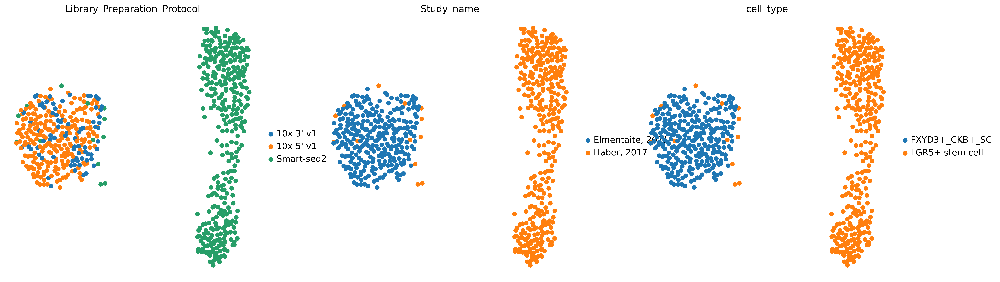

In [86]:
sc.set_figure_params(dpi=300, figsize=(7, 7))
sc.pl.umap(adata_joined, color=['Library_Preparation_Protocol', 'Study_name', 'cell_type'], frameon=False)

+ Extract meaningful latent directions

In [87]:
q_intr_cvae.latent_directions(adata=adata_joined)

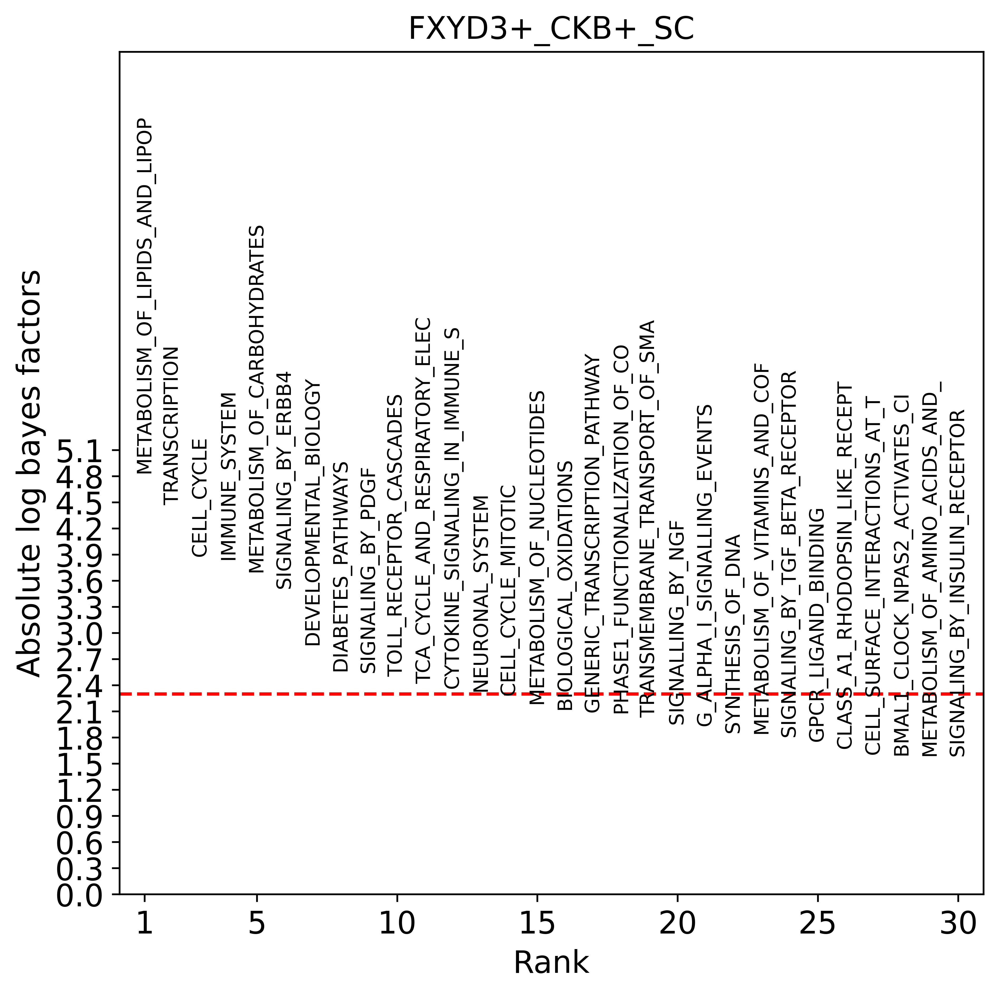

In [88]:
sc.set_figure_params(dpi=300, figsize=(7, 7))
q_intr_cvae.latent_enrich(groups = 'cell_type', comparison = 'LGR5+ stem cell', adata = adata_joined, use_directions = True)
fig = sca.plotting.plot_abs_bfs(adata_joined, yt_step = 0.3, scale_y = 2, fontsize = 9)

In [89]:
df=q_intr_cvae.term_genes('IMMUNE_SYSTEM', terms=adata_joined.uns['terms'])
df.to_csv('data/expimap_results/IMMUNE_SYSTEM_genes_FXYD3_vs_LGR5+.csv')

+ Extract gene programs and absolute log bayes factors in the dataframe 

In [59]:
scores = adata_joined.uns['bf_scores']
terms = adata_joined.uns['terms']

all_programs = []

for key in scores.keys():
    bfs = np.abs(scores[key]['bf'])
    for bf, term in zip(bfs, terms):
        all_programs.append({
            'Comparison': key,
            'Gene Program': term,
            'Absolute Log Bayes Factor': bf
        })

df_gene_programs = pd.DataFrame(all_programs)
df_gene_programs = df_gene_programs.sort_values('Absolute Log Bayes Factor', ascending=False)

In [60]:
print(df_gene_programs.head())

         Comparison                    Gene Program  Absolute Log Bayes Factor
136  FXYD3+_CKB+_SC  METABOLISM_OF_LIPIDS_AND_LIPOP                   8.194168
76   FXYD3+_CKB+_SC               DIABETES_PATHWAYS                   4.472919
162  FXYD3+_CKB+_SC     METABOLISM_OF_CARBOHYDRATES                   4.228667
182  FXYD3+_CKB+_SC          TOLL_RECEPTOR_CASCADES                   4.133572
51   FXYD3+_CKB+_SC   GENERIC_TRANSCRIPTION_PATHWAY                   4.071056


In [61]:
df_gene_programs.to_csv('data/expimap_results/LGR5high_vs_FXYD3+_CKB+_SC.csv', index=False)